In [43]:
import os
import mne
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy

from collections import defaultdict

import functions.utils as utils
import functions.io as io
import functions.preprocessing as preprocessing

In [128]:
# Session to preprocess
session_id = "sub027 DBS ON mSST"
sub = session_id.split(' ') [0]
condition = session_id.split(' ') [1] + ' ' + session_id.split(' ') [2]

working_path = os.path.dirname(os.getcwd())
onedrive_path = utils._get_onedrive_path()

sub_onedrive_path_task = os.path.join(onedrive_path, sub, 'synced_data', session_id)

#  Set saving and source paths
results_path = os.path.join(working_path, "results")
saving_path = os.path.join(results_path, session_id)
source_path = os.path.join(saving_path, "sub_data", f"{sub}", "data")
file_p = os.path.join(source_path, f"{sub}_postICA_EEGdata_eeg.fif")
fig_saving_path = os.path.join(saving_path, "sub_data", f"{sub}", 'figures')

# Load fif file
raw = mne.io.read_raw_fif(file_p, preload=True)
ch_names = raw.info['ch_names']

Opening raw data file c:\Users\Juliette\Research\Projects\analysis_mSST\results\sub027 DBS ON mSST\sub_data\sub027\data\sub027_postICA_EEGdata_eeg.fif...


FileNotFoundError: fname does not exist: "c:\Users\Juliette\Research\Projects\analysis_mSST\results\sub027 DBS ON mSST\sub_data\sub027\data\sub027_postICA_EEGdata_eeg.fif"

In [123]:
eeg_data = raw.get_data(picks='eeg')
eeg_times = raw.times
print(eeg_times.shape)  # (n_times,)

eeg_data.shape  # (n_channels, n_times)
print(eeg_data.shape)


(2821096,)
(32, 2821096)


In [124]:
ch_names.remove('BIP 02')
ch_names.remove('BIP 03')

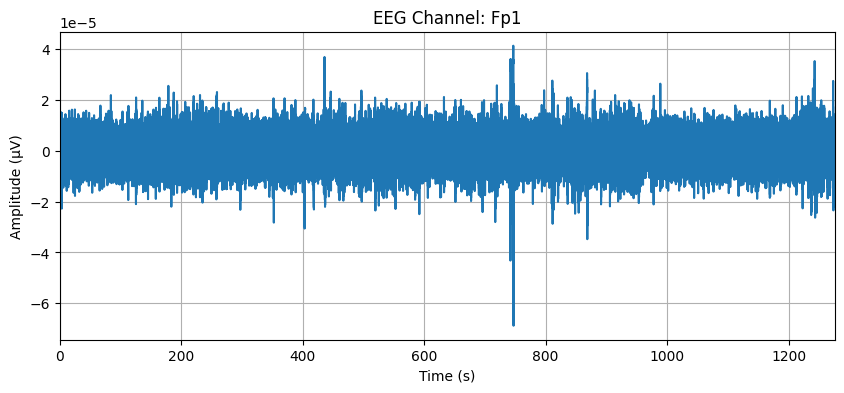

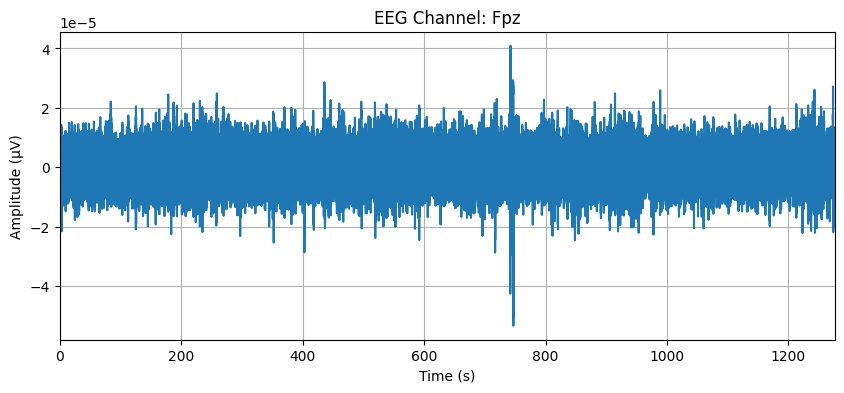

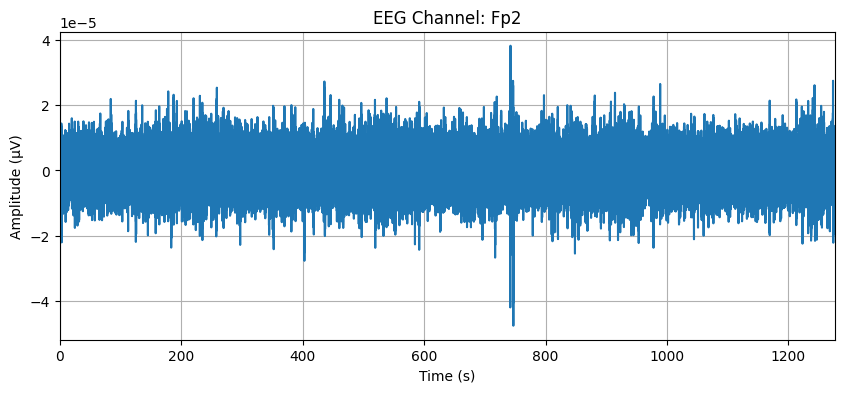

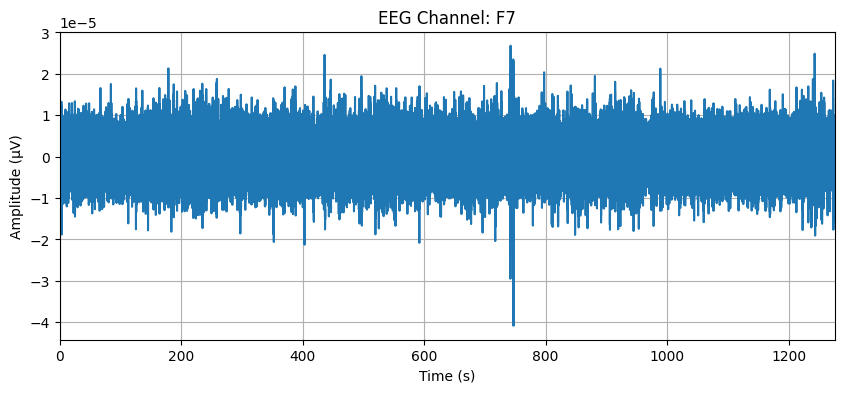

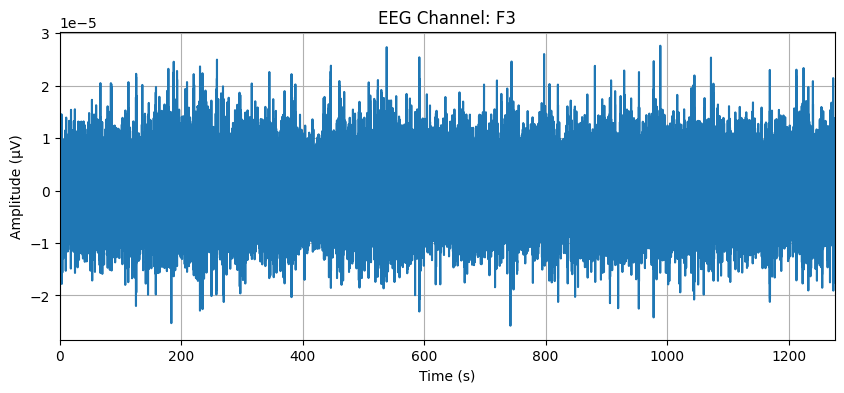

...

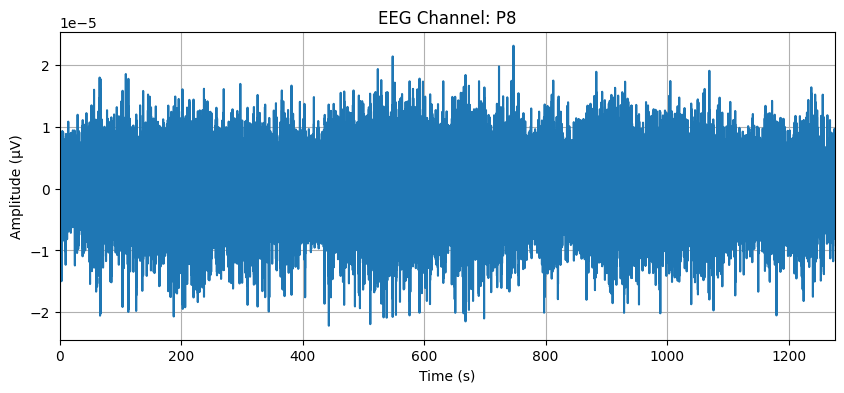

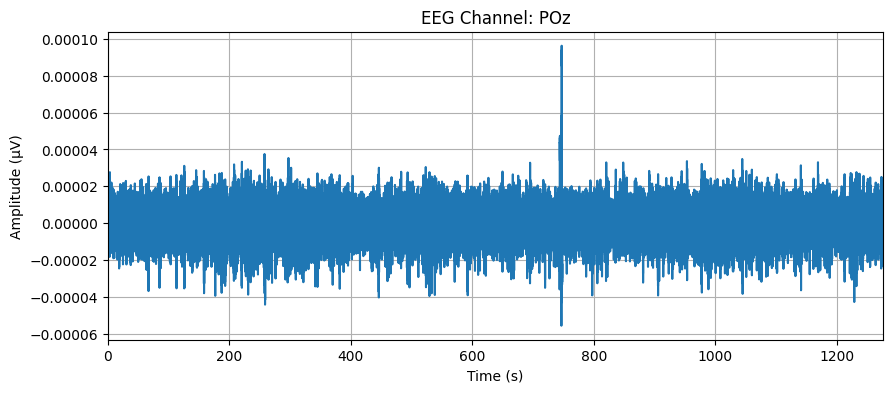

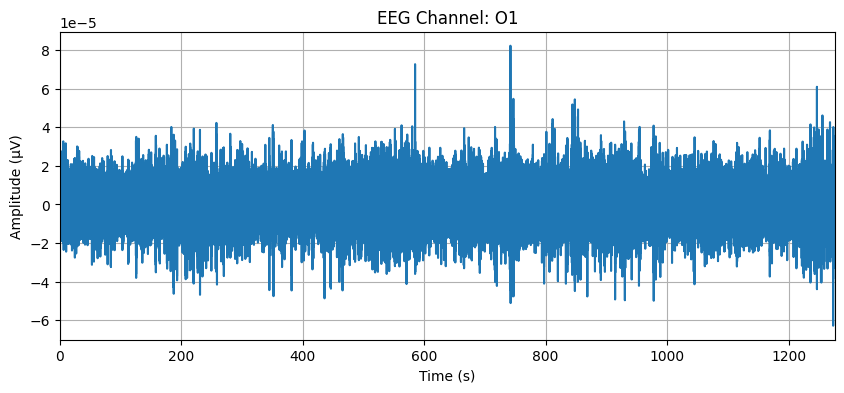

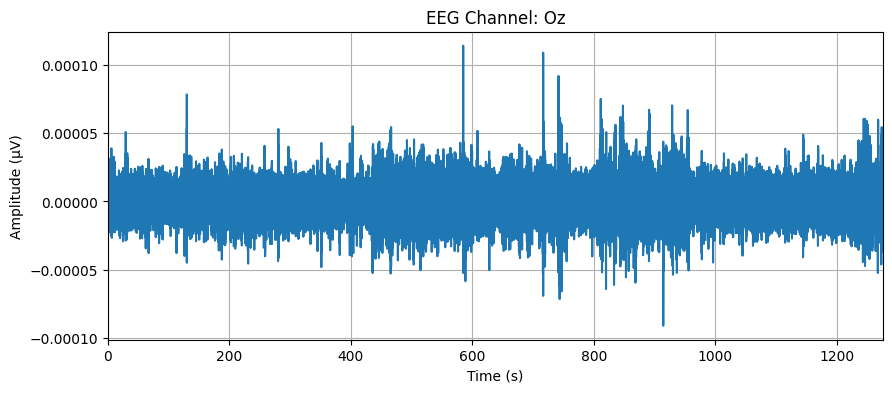

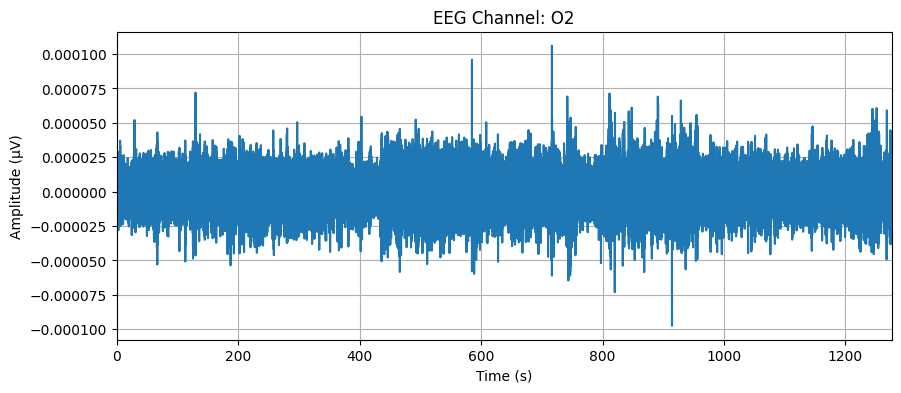

In [ ]:
# %matplotlib inline
# for ch in ch_names:
#     ch_index = ch_names.index(ch)
#     plt.figure(figsize=(10, 4))
#     plt.plot(eeg_times, eeg_data[ch_index, :])
#     plt.title(f'EEG Channel: {ch}')
#     plt.xlabel('Time (s)')
#     plt.ylabel('Amplitude (µV)')
#     plt.xlim(eeg_times[0], eeg_times[-1])
#     plt.grid()
#     plt.show()

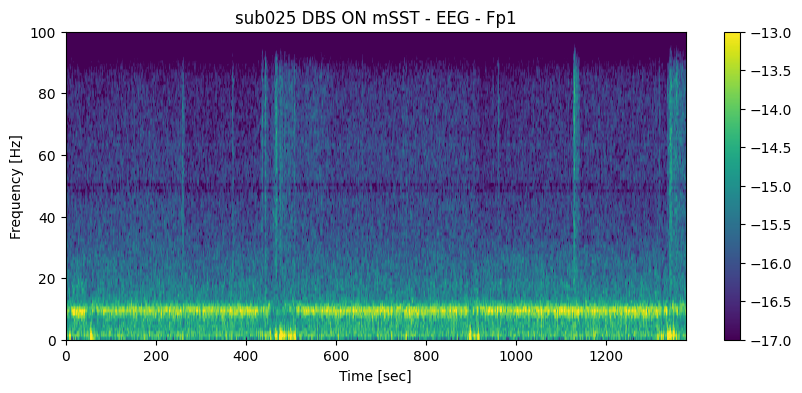

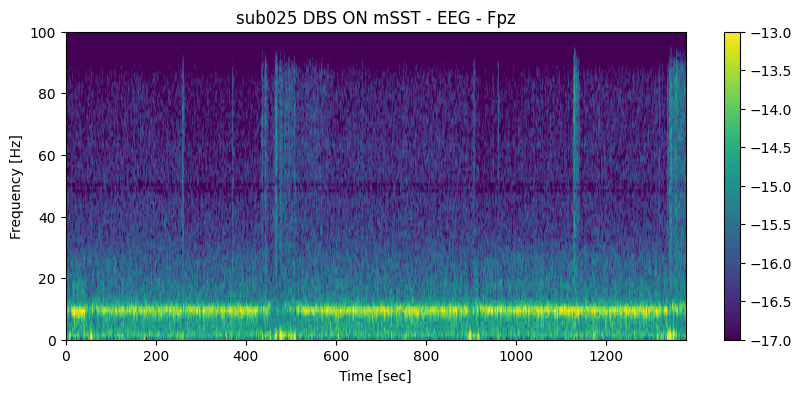

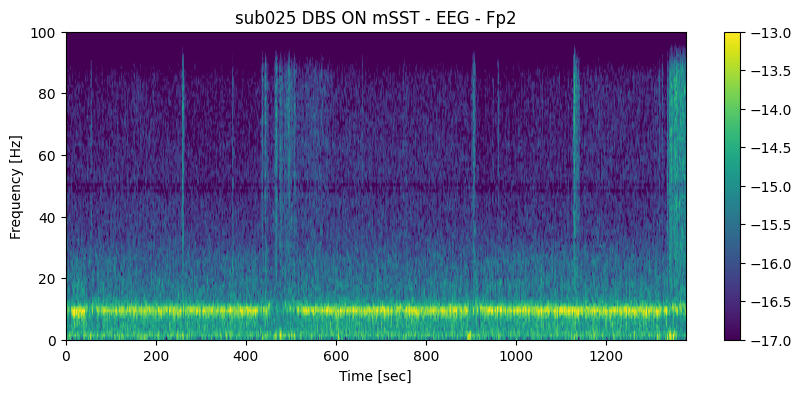

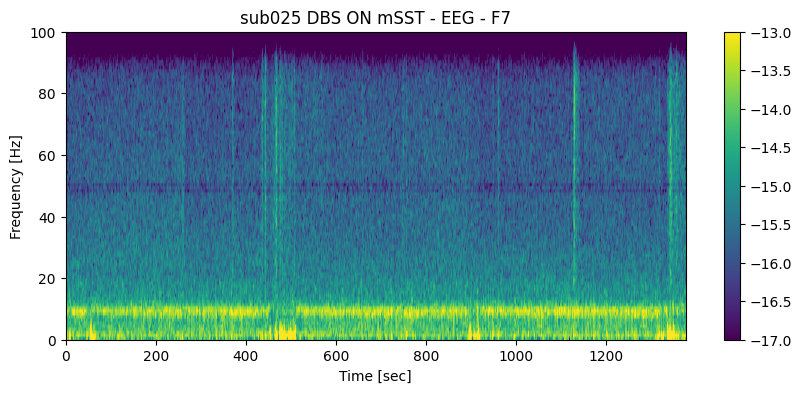

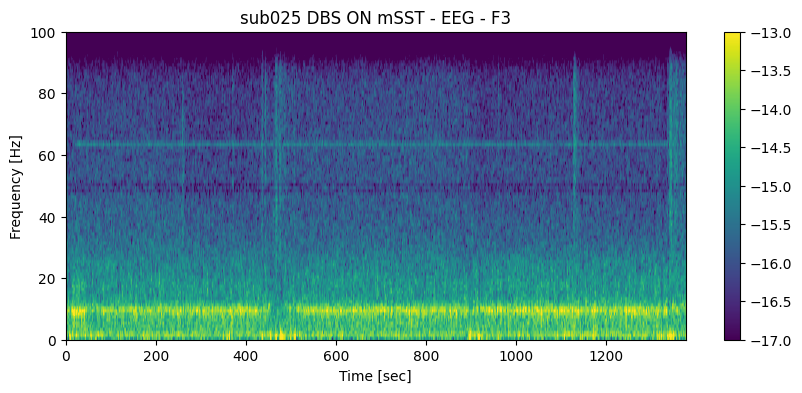

...

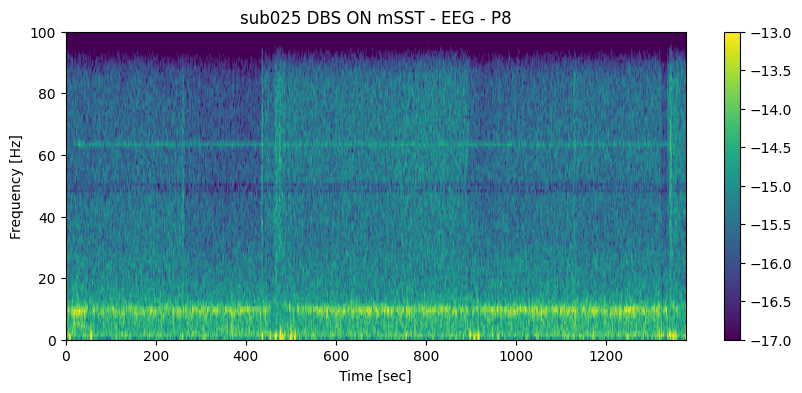

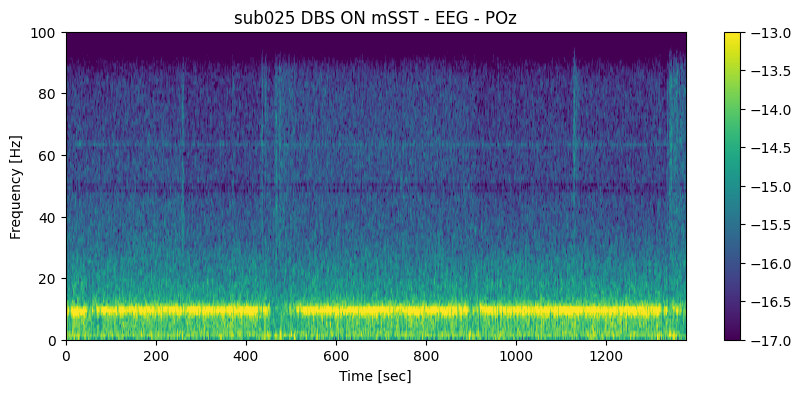

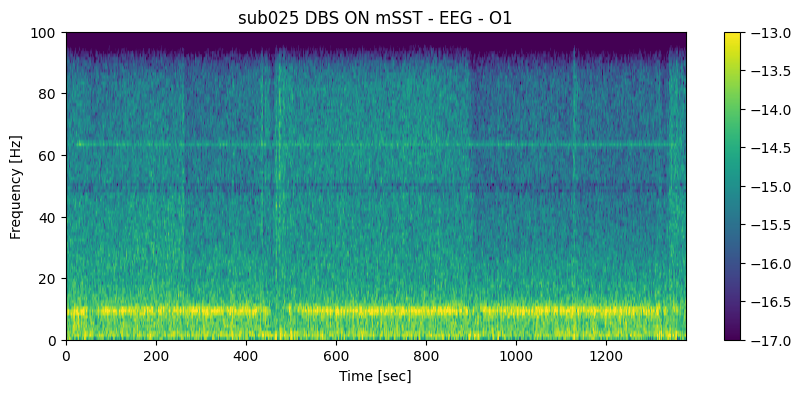

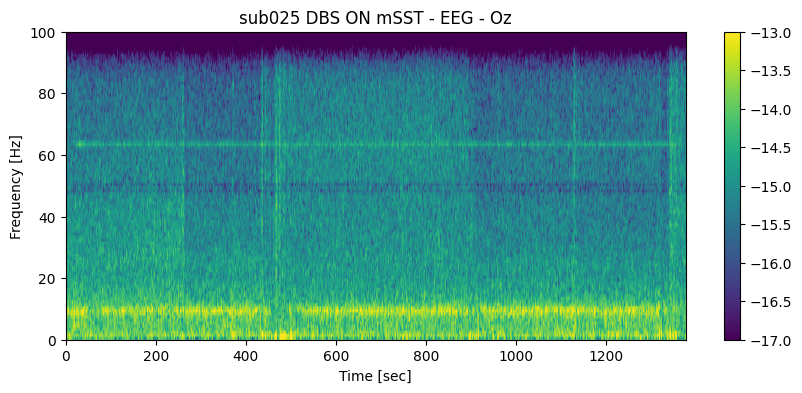

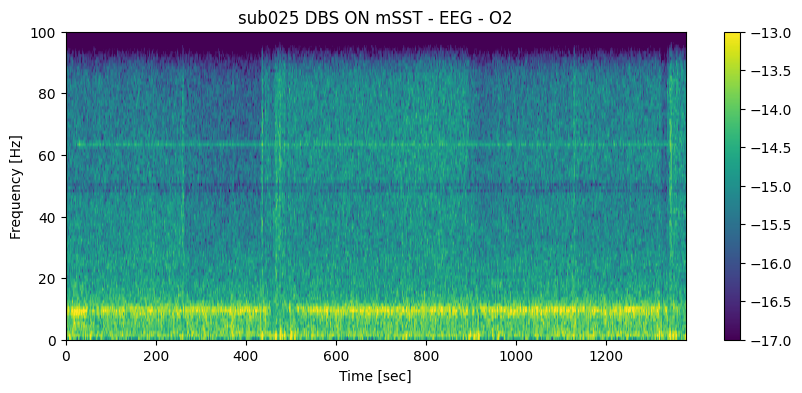

In [125]:
%matplotlib inline
vmin, vmax = -17, -13

for ch in ch_names:
    ch_index = ch_names.index(ch)

    f, t, Zxx = scipy.signal.stft(
        eeg_data[ch_index, :], raw.info['sfreq'], nperseg=int(round(raw.info['sfreq'])), noverlap=int(round(raw.info['sfreq']) / 2), nfft=int(round(raw.info['sfreq']))
    )
    Pxx = np.abs(Zxx)
    plt.figure(figsize=(10, 4))
    im = plt.imshow(np.log(Pxx), aspect='auto', origin='lower',
                            extent=[t[0], t[-1], f[0], f[-1]], cmap='viridis',
                            vmin=vmin, vmax=vmax)
    plt.ylim(0,100)
    plt.colorbar()
    plt.xlabel('Time [sec]')
    plt.ylabel('Frequency [Hz]')
    plt.title(f'{session_id} - EEG - {ch}')
    plt.savefig(os.path.join(fig_saving_path, f"{session_id}_{ch}_STFT.png"))
    plt.show()